# Implementación de una DC-GAN para la generación de mapas de altura

Este notebook contiene la implementación de una DC-GAN para la generación de mapas de altura. El dataset utilizado es el de [World Heightmaps 01](https://huggingface.co/datasets/hayden-donnelly/world-heightmaps-01). Se trata de un conjunto de datos de ~600k mapas de altura de 360x360. Los mapas de altura están etiquetados según su latitud y longitud, así como una identificación de corte unidimensional.

In [1]:
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Establecemos la semilla manualmente para reproducibilidad
manualSeed = 999
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Para que sea determinista

c:\Users\arrob\anaconda3\envs\wonder3d\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Random Seed:  999


In [31]:
# Directorio raíz para el conjunto de datos
dataroot = "data/test"

# Número de trabajadores para dataloader
workers = 2

# Tamaño del lote durante el entrenamiento
batch_size = 128

# Tamaño espacial de las imágenes de entrenamiento. Todas las imágenes cambiarán de tamaño a este tamaño usando un transformador.
image_size = 64

# Número de canales en las imágenes de entrenamiento. Para imágenes en color, esto es 3
nc = 3

# Tamaño del vector latente (es decir, tamaño del generador de entrada)
nz = 100

# Número de características del generador
ngf = 64

# Número de características del discriminador
ndf = 64

# Número de epochs
num_epochs = 5

# Learning rate para optimizadores
lr = 0.0002

# Hiperparámetro para el optimizador Adam
beta1 = 0.5

# Número de GPUs disponibles. Use 0 para ejecutar en CPU mode.
ngpu = 1

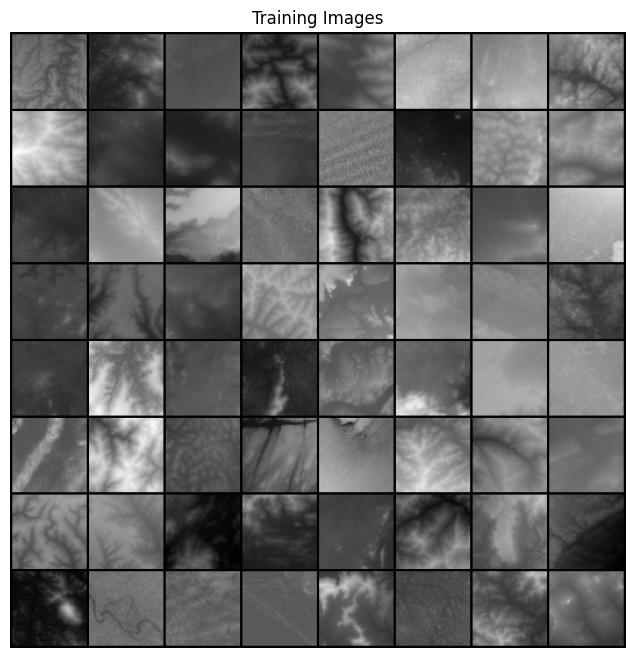

In [32]:
# Creamos el dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Creamos el dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Seleccionamos el dispositivo que se utilizará durante el entrenamiento
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Imprimimos la información del dataset
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [34]:
len(dataset)

204239

In [35]:
# Inicialización de pesos personalizados llamada en ``netG`` y ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [36]:
# Generador

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # la entrada es Z, entrando en una convolución
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # tamaño del estado. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # tamaño del estado. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # tamaño del estado. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # tamaño del estado. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

In [37]:
# Creamos el generador
netG = Generator(ngpu).to(device)

# Manejamos múltiples GPUs si es necesario
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Aplicamos la función ``weights_init`` para inicializar aleatoriamente todos los pesos a ``media=0``, ``desvestándar=0.02``.
netG.apply(weights_init)

# Imprimimos el  modelo
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [38]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # la entrada es ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # tamaño del estado. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # tamaño del estado. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # tamaño del estado. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # tamaño del estado. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [39]:
# Creamos el discriminador
netD = Discriminator(ngpu).to(device)

# Manejamos múltiples GPUs si es necesario
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
# Aplicamos la función ``weights_init`` para inicializar aleatoriamente todos los pesos así: ``para significar=0, stdev=0.2``.
netD.apply(weights_init)

# Imprimimos el modelo
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [40]:
# Inicializar la función ``BCELoss``
criterion = nn.BCELoss()

# Crear lote de vectores latentes que usaremos para visualizar la progresión del generador
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establecer convenciones para etiquetas reales y falsas durante la capacitación.
real_label = 1.
fake_label = 0.

# Configurar optimizadores Adam para G y D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [41]:
# Training Loop

# Listas para realizar un seguimiento del progreso
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# Para cada época
for epoch in range(num_epochs):
    # Para cada lote en el dataloader
    for i, data in enumerate(dataloader, 0):
        
        ############################
        # (1) Actualizamos D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Entrenar con lotes totalmente reales
        netD.zero_grad()
        # Formatear batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Pasar hacia adelante el lote real a través de D
        output = netD(real_cpu).view(-1)
        # Calcular la pérdida en un lote totalmente real
        errD_real = criterion(output, label)
        # Calcular gradientes para D en pase hacia atrás
        errD_real.backward()
        D_x = output.mean().item()

        ## Entrena con un lote totalmente falso
        # Generar lote de vectores latentes
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generar lote de imágenes falsas con G
        fake = netG(noise)
        label.fill_(fake_label)
        # Clasificar todos los lotes falsos con D
        output = netD(fake.detach()).view(-1)
        # Calcule la pérdida de D en el lote totalmente falso
        errD_fake = criterion(output, label)
        # Calcule los gradientes para este lote, acumulados (sumados) con gradientes anteriores
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Calcular el error de D como suma de los lotes falso y real
        errD = errD_real + errD_fake
        # Actualizar D
        optimizerD.step()

        ############################
        # (2) Actualizar G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # Las etiquetas falsas son reales para el costo del generador.
        # Como acabamos de actualizar D, realice otro paso hacia adelante del lote totalmente falso a través de D
        output = netD(fake).view(-1)
        # Calcular la pérdida de G en función de esta salida.
        errG = criterion(output, label)
        # Calcular gradientes para G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Actualizar G
        optimizerG.step()
        
        # Estadísticas de entrenamiento de salida
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        # Guardamos las pérdidas para trazarlas más tarde
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Comprobamos cómo funciona el generador guardando la salida de G en fix_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1


Starting Training Loop...
[0/5][0/1596]	Loss_D: 2.0476	Loss_G: 6.1177	D(x): 0.5591	D(G(z)): 0.6808 / 0.0038
[0/5][50/1596]	Loss_D: 0.0272	Loss_G: 37.7366	D(x): 0.9762	D(G(z)): 0.0000 / 0.0000
[0/5][100/1596]	Loss_D: 0.0006	Loss_G: 37.2562	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[0/5][150/1596]	Loss_D: 0.0003	Loss_G: 36.8003	D(x): 0.9997	D(G(z)): 0.0000 / 0.0000
[0/5][200/1596]	Loss_D: 0.0001	Loss_G: 36.2713	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[0/5][250/1596]	Loss_D: 0.0002	Loss_G: 35.3154	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[0/5][300/1596]	Loss_D: 0.0088	Loss_G: 35.6088	D(x): 0.9917	D(G(z)): 0.0000 / 0.0000
[0/5][350/1596]	Loss_D: 0.0026	Loss_G: 33.8233	D(x): 0.9976	D(G(z)): 0.0000 / 0.0000
[0/5][400/1596]	Loss_D: 1.1472	Loss_G: 6.0325	D(x): 0.8308	D(G(z)): 0.4817 / 0.0077
[0/5][450/1596]	Loss_D: 1.2769	Loss_G: 1.0680	D(x): 0.3725	D(G(z)): 0.1168 / 0.4276
[0/5][500/1596]	Loss_D: 1.1179	Loss_G: 2.8743	D(x): 0.7169	D(G(z)): 0.4835 / 0.0813
[0/5][550/1596]	Loss_D: 1.2026	Loss_G: 0.7708	

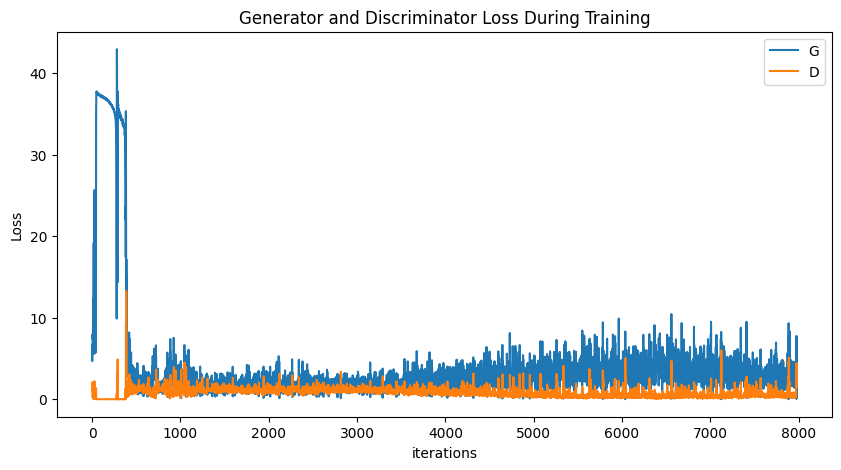

In [42]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

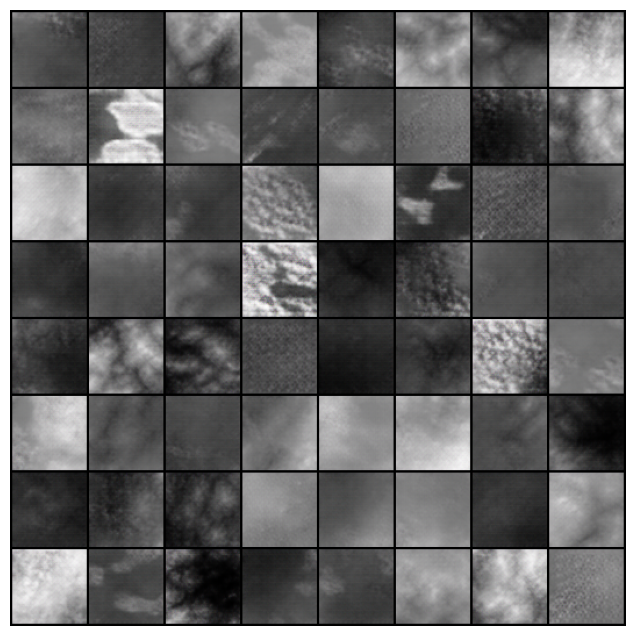

In [43]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

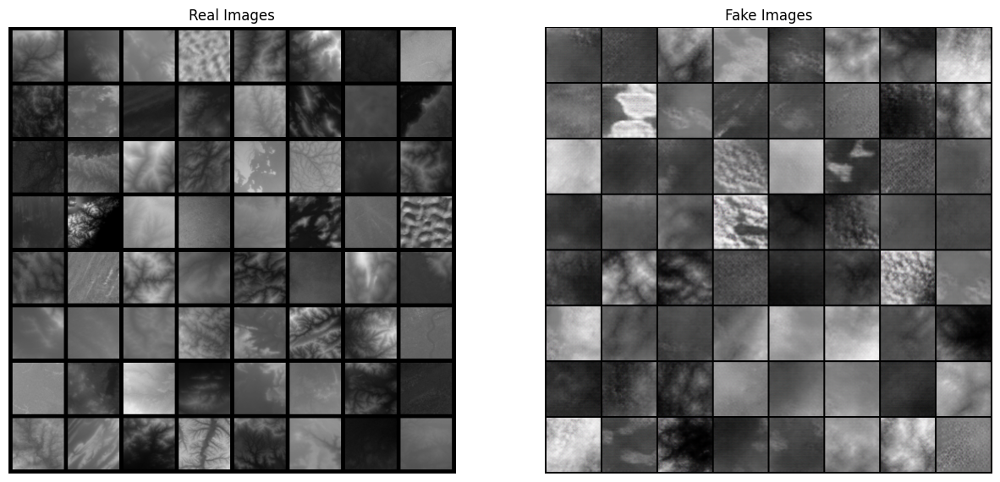

In [44]:
# Obtenemos un lote de imágenes reales del cargador de datos
real_batch = next(iter(dataloader))

# Visualizamos algunas imágenes reales
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Visualizamos algunas imágenes falsas
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [45]:
# Guardamos el modelo
torch.save(netG.state_dict(), 'generator.pth')
torch.save(netD.state_dict(), 'discriminator.pth')

In [ ]:
# Cargamos el modelo
netG = Generator(ngpu).to(device)
netG.load_state_dict(torch.load('generator.pth'))
netD.load_state_dict(torch.load('discriminator.pth'))

# Generamos un lote de imágenes falsas y guárdalas
fake = netG(fixed_noise).detach().cpu()
plt.figure(figsize=(15,15))
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(vutils.make_grid(fake, padding=5, normalize=True),(1,2,0)))
plt.show()

